# 전체 데이터 작업 

In [2]:
# 작업 순서
# 1. 데이터 가져오기 (5~8월)
# 2. 카테고리 추가하기 
# 3. 시간대 추가하기 
# 4. 지역 선정 > 상위 업종 barplot 
# 5. 업종별 시간대 건수 확인 
# 6. folium 사용 

In [2]:
# 1. 데이터 가져오기 (5~8월)

import pickle
with open('jeju_uniq_data5.pickle','rb') as fr:
    jeju_5 = pickle.load(fr)
with open('jeju_uniq_data6.pickle','rb') as fr:
    jeju_6 = pickle.load(fr)
with open('jeju_uniq_data7.pickle','rb') as fr:
    jeju_7 = pickle.load(fr)
with open('jeju_uniq_data8.pickle','rb') as fr:
    jeju_8 = pickle.load(fr)

In [3]:
jeju_7.drop(columns=['X','Y'],axis=1,inplace=True)

In [4]:
jeju_all = pd.concat([jeju_5,jeju_6,jeju_7,jeju_8],axis=0, sort=False)
jeju_all.head()

,OBJECTID,Field1,YM,SIDO,SIGUNGU,FranClass,Type,Time,TotalSpent,DisSpent,NumofSpent,NumofDisSpent,POINT_X,POINT_Y,lon,lat,lon_lat,dong
0,1,1,202005,제주특별자치도,제주시,영세,일반한식,00시,363000,66500,10,2,877005.9834,1479766.073,126.17889362710162,33.30231529076243,126.17889362710162_33.30231529076243,한경면
1,4904,4904,202005,제주특별자치도,제주시,영세,일반한식,01시,86500,0,3,0,877005.9834,1479766.073,126.17889362710162,33.30231529076243,126.17889362710162_33.30231529076243,한경면
2,8569,8569,202005,제주특별자치도,제주시,영세,일반한식,02시,208000,0,5,0,877005.9834,1479766.073,126.17889362710162,33.30231529076243,126.17889362710162_33.30231529076243,한경면
3,11270,11270,202005,제주특별자치도,제주시,영세,일반한식,03시,18000,0,1,0,877005.9834,1479766.073,126.17889362710162,33.30231529076243,126.17889362710162_33.30231529076243,한경면
4,19122,19122,202005,제주특별자치도,제주시,중소,한의원,07시,4800,0,2,0,877005.9834,1479766.073,126.17889362710162,33.30231529076243,126.17889362710162_33.30231529076243,한경면


In [5]:
jeju_cat = jeju_all.copy()

In [21]:
# # 피클 저장하기 

# with open('jeju_all.pickle','wb') as fw:
#     pickle.dump(jeju_all, fw)

In [6]:
# 2. 카테고리 추가하기 

jeju_cat.replace(dict.fromkeys(['택시', '기타교통수단', '통신기기'], '교통/통신'), inplace=True)
jeju_cat.replace(dict.fromkeys(['대형할인점', '농축협직영매장', '농협하나로클럽', '편의점', '슈퍼마켓', '정육점', '기타유통업', '연쇄점', '상품권', '인삼제품', '홍삼제품', '농축수산품', '주류판매점', '기타건강식', '건강식품(회원제형태)'], '마트/편의점(유통)'), inplace=True)
jeju_cat.replace(dict.fromkeys(['악기점', 'DVD음반테이프판매', '문화취미기타', '영화관', '티켓', '수족관', '화랑'], '영화/문화'), inplace=True)
jeju_cat.replace(dict.fromkeys(['내의판매점', '양품점', '옷감직물', '귀금속', '기타직물', '스포츠의류', '가방', '정장', '악세사리', '기타잡화', '신발', '기타의류', '단체복', '아동의류', '캐쥬얼의류', '맞춤복점', '제화점', '인터넷Mall', '인터넷종합Mall'], '쇼핑/패션'), inplace=True)
jeju_cat.replace(dict.fromkeys(['제과점', '스넥', '기타음료식품'], '카페/베이커리'), inplace=True)
jeju_cat.replace(dict.fromkeys(['미용재료', '화장품', '피부미용실', '미용원', '이용원'], '뷰티'), inplace=True)
jeju_cat.replace(dict.fromkeys(['구내매점', '단란주점', '주점', '서양음식', '일반한식', '일식회집', '중국음식',  '유흥주점', '칵테일바'], '외식/주점'), inplace=True)
jeju_cat.replace(dict.fromkeys(['세탁소', '애완동물', '화원', '침구수예점', '성인용품점', '가전제품', '기타가구', '조명기구', '민예공예품', '주방용식기', '기타전기제품', '소프트웨어', '주방용구', '카페트커텐천막', '컴퓨터', '카메라', '일반가구', '정수기', '철제가구', '시계', '안경', '사우나', '안마스포츠마사지', '사진관', '인테리어', 'CATV'], '생활/기타'), inplace=True)
jeju_cat.replace(dict.fromkeys(['완구점', '화방표구점', '문구용품', '일반서적', '출판인쇄물', '기타사무용', '사무기기', '전문서적', '정기간행물', '기타서적문구', '서적출판(회원제형태)'], '서점/문구'), inplace=True)
jeju_cat.replace(dict.fromkeys(['기타보험', '손해보험'], '금융'), inplace=True)
jeju_cat.replace(dict.fromkeys(['기념품점', '기타숙박업', '특급호텔', '2급호텔', '1급호텔', '콘도', '렌트카', '관광여행', '항공사', '여객선', '면세점'], '여행/숙박'), inplace=True)
jeju_cat.replace(dict.fromkeys(['레져용품수리', '스포츠레져용품', '골프용품', '노래방', '당구장', '골프경기장', '볼링장', '골프연습장', '헬스크럽', '레져업소(회원제형태)', '기타레져업', '종합레져타운', '수영장', '테니스장', '기타회원제형태업소', ], '레저/스포츠'), inplace=True)
jeju_cat.replace(dict.fromkeys(['유아원', '독서실', '보습학원', '기능학원', '기타교육', '외국어학원', '학원(회원제형태)', '예체능학원', '컴퓨터학원', '대학등록금', '학습지교육', '초중고교육기관'], '교육/육아'), inplace=True)
jeju_cat.replace(dict.fromkeys(['주유소', '자동차정비', 'LPG', '세차장', '유류판매', '이륜차판매', '윤활유전문판매', '자동차시트타이어', '중고자동차', '수입자동차', '자동차부품', '주차장', '기타자동차서비스', '카인테리어', ], '주유/자동차'), inplace=True)
jeju_cat.replace(dict.fromkeys(['약국', '종합병원', '기타의료기관및기기', '한약방', '제약회사', '의료용품', '건강진단', '한의원', '동물병원', '의원', '치과의원', '병원', '산후조리원', '치과병원'], '의료'), inplace=True)
jeju_cat.replace(dict.fromkeys(['목재석재철물', '건축요업품', '골동품점', '기계공구', '기타건축자재', '보일러펌프', '페인트', '냉열기기', '유리', '과학기자재', '기타광학품', '기타연료', '중장비수리', ], '건설/제조'), inplace=True)
jeju_cat.replace(dict.fromkeys(['기타농업관련', '비료농약사료종자', '농기계', '미곡상'], '농업'), inplace=True)
jeju_cat.replace(dict.fromkeys(['사무서비스', '기타대인서비스', '화물운송', '보관창고업', '종합용역', '조세서비스', '가례서비스', '공공요금', '위탁급식업', '기타용역서비스', '기타수리서비스', '기타운송', '가정용품수리', '견인서비스', '부동산중개임대', '부동산분양', '신변잡화수리', '사무통신기기수리', '법률회계서비스', '사무서비스(회원제형태)', '정보서비스', '기타업종', '기타비영리유통'], '서비스/기타'), inplace=True)

In [7]:
# 카테고리 추가하기 
jeju_all['Category'] = jeju_cat['Type']
jeju_all.head()

,OBJECTID,Field1,YM,SIDO,SIGUNGU,FranClass,Type,Time,TotalSpent,DisSpent,NumofSpent,NumofDisSpent,POINT_X,POINT_Y,lon,lat,lon_lat,dong,Category
0,1,1,202005,제주특별자치도,제주시,영세,일반한식,00시,363000,66500,10,2,877005.9834,1479766.073,126.17889362710162,33.30231529076243,126.17889362710162_33.30231529076243,한경면,외식/주점
1,4904,4904,202005,제주특별자치도,제주시,영세,일반한식,01시,86500,0,3,0,877005.9834,1479766.073,126.17889362710162,33.30231529076243,126.17889362710162_33.30231529076243,한경면,외식/주점
2,8569,8569,202005,제주특별자치도,제주시,영세,일반한식,02시,208000,0,5,0,877005.9834,1479766.073,126.17889362710162,33.30231529076243,126.17889362710162_33.30231529076243,한경면,외식/주점
3,11270,11270,202005,제주특별자치도,제주시,영세,일반한식,03시,18000,0,1,0,877005.9834,1479766.073,126.17889362710162,33.30231529076243,126.17889362710162_33.30231529076243,한경면,외식/주점
4,19122,19122,202005,제주특별자치도,제주시,중소,한의원,07시,4800,0,2,0,877005.9834,1479766.073,126.17889362710162,33.30231529076243,126.17889362710162_33.30231529076243,한경면,의료


In [8]:
# # 피클 저장하기 

# with open('jeju_all.pickle','wb') as fw:
#     pickle.dump(jeju_all, fw)

In [9]:
jeju_all.head()

,OBJECTID,Field1,YM,SIDO,SIGUNGU,FranClass,Type,Time,TotalSpent,DisSpent,NumofSpent,NumofDisSpent,POINT_X,POINT_Y,lon,lat,lon_lat,dong,Category
0,1,1,202005,제주특별자치도,제주시,영세,일반한식,00시,363000,66500,10,2,877005.9834,1479766.073,126.17889362710162,33.30231529076243,126.17889362710162_33.30231529076243,한경면,외식/주점
1,4904,4904,202005,제주특별자치도,제주시,영세,일반한식,01시,86500,0,3,0,877005.9834,1479766.073,126.17889362710162,33.30231529076243,126.17889362710162_33.30231529076243,한경면,외식/주점
2,8569,8569,202005,제주특별자치도,제주시,영세,일반한식,02시,208000,0,5,0,877005.9834,1479766.073,126.17889362710162,33.30231529076243,126.17889362710162_33.30231529076243,한경면,외식/주점
3,11270,11270,202005,제주특별자치도,제주시,영세,일반한식,03시,18000,0,1,0,877005.9834,1479766.073,126.17889362710162,33.30231529076243,126.17889362710162_33.30231529076243,한경면,외식/주점
4,19122,19122,202005,제주특별자치도,제주시,중소,한의원,07시,4800,0,2,0,877005.9834,1479766.073,126.17889362710162,33.30231529076243,126.17889362710162_33.30231529076243,한경면,의료


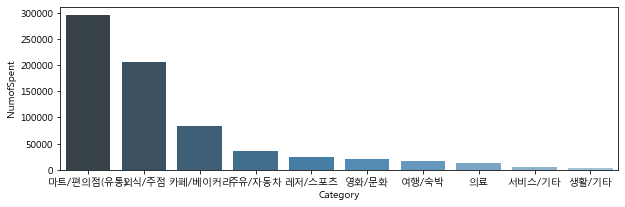

In [13]:
# 4. 지역 선정 > 상위 업종 barplot 
# 지역 선정 

# 지역 선정하기 #조천읍 

cond1 = jeju_all['SIGUNGU'] == '제주시'
cond2 = jeju_all['dong'].str.contains('조천읍')
df_reg_jce = jeju_all[cond1&cond2]
df_reg_jce.head(5)


# 상위 10개에 대해 확인 
from matplotlib import font_manager, rc
import matplotlib.pyplot as plt
plt.rcParams['axes.unicode_minus'] = False
f_path= "C:/Windows/Fonts/malgun.ttf"
font_name= font_manager.FontProperties(fname=f_path).get_name()
rc('font', family =font_name)
plt.rc('font', family='Malgun Gothic')
import seaborn as sns

# 조천읍의 카테고리별로 업종 그룹 
df_reg_jce_cat = df_reg_jce.groupby(['Category']).sum()
df_reg_jce_cat = df_reg_jce_cat.sort_values('NumofSpent', ascending=False)
df_reg_jce_cat = df_reg_jce_cat.reset_index()


plt.figure(figsize=(10,3))
sns.barplot(x='Category', y ='NumofSpent', data=df_reg_jce_cat[:10],palette = 'Blues_d')


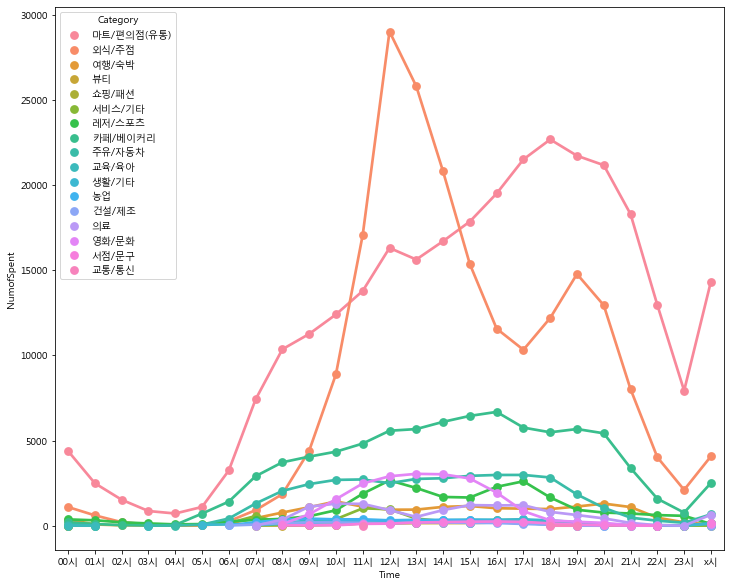

In [14]:
# 5. 업종별 시간대 건수 확인 

df_reg_jce_time = df_reg_jce.groupby(Category['Category','Time']).sum()
df_reg_jce_time = df_reg_jce_time.sort_values('Time')
df_reg_jce_time = df_reg_jce_time.reset_index()

plt.figure(figsize=(12,10))
sns.pointplot(x='Time', y ='NumofSpent', data=df_reg_jce_time, hue='Category')

################### 상위 업종 10개 - 업종 TYPE 구분 필요함 ##########################

In [21]:
# 6. folium 사용 
import pandas as pd 
import folium
from folium.plugins import MarkerCluster, MiniMap

In [32]:
df_1 = df_reg_jce[df_reg_jce['Category']=='마트/편의점(유통)'] #마트편의점에 대해 추출 
df_1 = df_1[['SIGUNGU','FranClass','Type','lon','lat','lon_lat']] #업종별 분포 확인에 대한 정보만 추출 
df_1.drop_duplicates(inplace=True) #중복되는 row 삭제 

df_2 = df_reg_jce[df_reg_jce['Category']=='외식/주점'] #외식주점에 대해 추출 
df_2 = df_2[['SIGUNGU','FranClass','Type','lon','lat','lon_lat']] #업종별 분포 확인에 대한 정보만 추출 
df_2.drop_duplicates(inplace=True) #중복되는 row 삭제 

df_3 = df_reg_jce[df_reg_jce['Category']=='카페/베이커리'] #카페베이커리에 대해 추출 
df_3 = df_3[['SIGUNGU','FranClass','Type','lon','lat','lon_lat']] #업종별 분포 확인에 대한 정보만 추출 
df_3.drop_duplicates(inplace=True) #중복되는 row 삭제 

df_4 = df_reg_jce[df_reg_jce['Category']=='주유/자동차'] #주유자동차에 대해 추출 
df_4 = df_4[['SIGUNGU','FranClass','Type','lon','lat','lon_lat']] #업종별 분포 확인에 대한 정보만 추출 
df_4.drop_duplicates(inplace=True) #중복되는 row 삭제 

df_5 = df_reg_jce[df_reg_jce['Category']=='레저/스포츠'] #레저스포츠에 대해 추출 
df_5 = df_5[['SIGUNGU','FranClass','Type','lon','lat','lon_lat']] #업종별 분포 확인에 대한 정보만 추출 
df_5.drop_duplicates(inplace=True) #중복되는 row 삭제 

df_6 = df_reg_jce[df_reg_jce['Category']=='영화/문화'] #레저스포츠에 대해 추출 
df_6 = df_6[['SIGUNGU','FranClass','Type','lon','lat','lon_lat']] #업종별 분포 확인에 대한 정보만 추출 
df_6.drop_duplicates(inplace=True) #중복되는 row 삭제 

df_7 = df_reg_jce[df_reg_jce['Category']=='여행/숙박'] #레저스포츠에 대해 추출 
df_7 = df_7[['SIGUNGU','FranClass','Type','lon','lat','lon_lat']] #업종별 분포 확인에 대한 정보만 추출 
df_7.drop_duplicates(inplace=True) #중복되는 row 삭제 

df_8 = df_reg_jce[df_reg_jce['Category']=='의료'] #레저스포츠에 대해 추출 
df_8 = df_8[['SIGUNGU','FranClass','Type','lon','lat','lon_lat']] #업종별 분포 확인에 대한 정보만 추출 
df_8.drop_duplicates(inplace=True) #중복되는 row 삭제 

df_9 = df_reg_jce[df_reg_jce['Category']=='서비스/기타'] #레저스포츠에 대해 추출 
df_9 = df_9[['SIGUNGU','FranClass','Type','lon','lat','lon_lat']] #업종별 분포 확인에 대한 정보만 추출 
df_9.drop_duplicates(inplace=True) #중복되는 row 삭제 

df_10 = df_reg_jce[df_reg_jce['Category']=='생활/기타'] #레저스포츠에 대해 추출 
df_10 = df_10[['SIGUNGU','FranClass','Type','lon','lat','lon_lat']] #업종별 분포 확인에 대한 정보만 추출 
df_10.drop_duplicates(inplace=True) #중복되는 row 삭제 


In [35]:
map = folium.Map((33.38773221915759, 126.54124720118492), zoom_start= 10)

# 마트/편의점 서클 추가 
# for i in range(len(df_1['Type'])):
#     folium.Circle(list(df_1.iloc[i][['lat','lon']]), radius=5, color = '#a6cee3',fill_color = '#a6cee3').add_to(map)

for i in range(len(df_2['Type'])):
    folium.Circle(list(df_2.iloc[i][['lat','lon']]), radius=5, color = '#1f78b4',fill_color = '#1f78b4', popup='외식/주점').add_to(map)

for i in range(len(df_3['Type'])):
    folium.Circle(list(df_3.iloc[i][['lat','lon']]), radius=5, color = '#b2df8a',fill_color = '#b2df8a').add_to(map)

# for i in range(len(df_4['Type'])):
#     folium.Circle(list(df_4.iloc[i][['lat','lon']]), radius=5, color = '#33a02c',fill_color = '#33a02c').add_to(map)

for i in range(len(df_5['Type'])):
    folium.Circle(list(df_5.iloc[i][['lat','lon']]), radius=5, color = '#fb9a99',fill_color = '#fb9a99').add_to(map)

# for i in range(len(df_6['Type'])):
#     folium.Circle(list(df_6.iloc[i][['lat','lon']]), radius=5, color = '#e31a1c',fill_color = '#e31a1c').add_to(map)

for i in range(len(df_7['Type'])):
    folium.Circle(list(df_7.iloc[i][['lat','lon']]), radius=5, color = '#fdbf6f',fill_color = '#fdbf6f').add_to(map)

# for i in range(len(df_8['Type'])):
#     folium.Circle(list(df_8.iloc[i][['lat','lon']]), radius=5, color = '#ff7f00',fill_color = '#ff7f00').add_to(map)

# for i in range(len(df_9['Type'])):
#     folium.Circle(list(df_9.iloc[i][['lat','lon']]), radius=5, color = '#cab2d6',fill_color = '#cab2d6').add_to(map)

# for i in range(len(df_10['Type'])):
#     folium.Circle(list(df_10.iloc[i][['lat','lon']]), radius=5, color = '#6a3d9a',fill_color = '#6a3d9a').add_to(map)

map

# 제주시 분석 

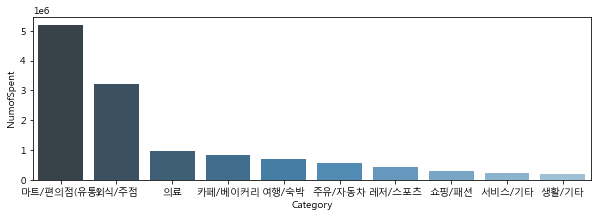

In [36]:
# 4. 지역 선정 > 상위 업종 barplot 
# 지역 선정 

# 지역 선정하기 #조천읍 

cond1 = jeju_all['SIGUNGU'] == '제주시'
cond2 = jeju_all['dong'].str.contains('동')
df_reg_jeju = jeju_all[cond1&cond2]
df_reg_jeju.head(5)


# 상위 10개에 대해 확인 
from matplotlib import font_manager, rc
import matplotlib.pyplot as plt
plt.rcParams['axes.unicode_minus'] = False
f_path= "C:/Windows/Fonts/malgun.ttf"
font_name= font_manager.FontProperties(fname=f_path).get_name()
rc('font', family =font_name)
plt.rc('font', family='Malgun Gothic')
import seaborn as sns

# 제주시내의 카테고리별로 업종 그룹 
df_reg_jeju_cat = df_reg_jeju.groupby(['Category']).sum()
df_reg_jeju_cat = df_reg_jeju_cat.sort_values('NumofSpent', ascending=False)
df_reg_jeju_cat = df_reg_jeju_cat.reset_index()


plt.figure(figsize=(10,3))
sns.barplot(x='Category', y ='NumofSpent', data=df_reg_jeju_cat[:10],palette = 'Blues_d')


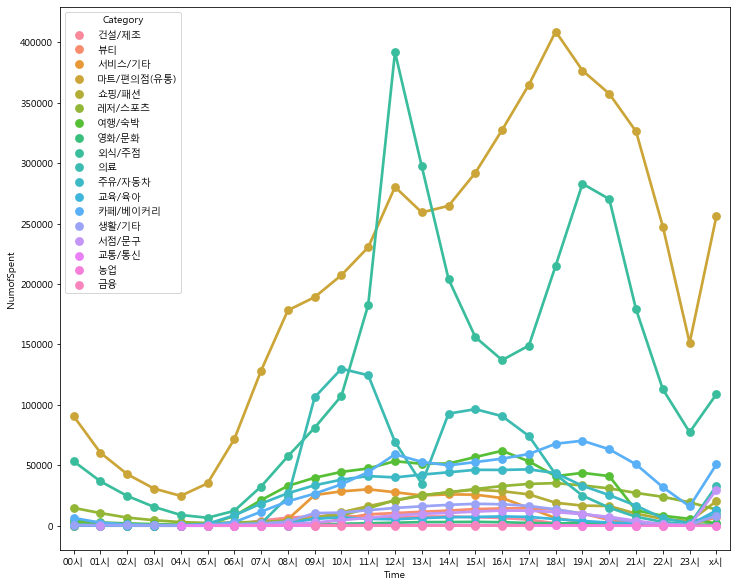

In [38]:
# 5. 업종별 시간대 건수 확인 

df_reg_jeju_time = df_reg_jeju.groupby(['Category','Time']).sum()
df_reg_jeju_time = df_reg_jeju_time.sort_values('Time')
df_reg_jeju_time = df_reg_jeju_time.reset_index()

plt.figure(figsize=(12,10))
sns.pointplot(x='Time', y ='NumofSpent', data=df_reg_jeju_time, hue='Category')

################### 상위 업종 10개 - 업종 TYPE 구분 필요함 ##########################

In [41]:
df_1 = df_reg_jeju[df_reg_jeju['Category']=='마트/편의점(유통)'] #마트편의점에 대해 추출 
df_1 = df_1[['SIGUNGU','FranClass','Type','lon','lat','lon_lat']] #업종별 분포 확인에 대한 정보만 추출 
df_1.drop_duplicates(inplace=True) #중복되는 row 삭제 

df_2 = df_reg_jeju[df_reg_jeju['Category']=='외식/주점'] #외식주점에 대해 추출 
df_2 = df_2[['SIGUNGU','FranClass','Type','lon','lat','lon_lat']] #업종별 분포 확인에 대한 정보만 추출 
df_2.drop_duplicates(inplace=True) #중복되는 row 삭제 

df_3 = df_reg_jeju[df_reg_jeju['Category']=='의료'] #카페베이커리에 대해 추출 
df_3 = df_3[['SIGUNGU','FranClass','Type','lon','lat','lon_lat']] #업종별 분포 확인에 대한 정보만 추출 
df_3.drop_duplicates(inplace=True) #중복되는 row 삭제 

df_4 = df_reg_jeju[df_reg_jeju['Category']=='카페/베이커리'] #주유자동차에 대해 추출 
df_4 = df_4[['SIGUNGU','FranClass','Type','lon','lat','lon_lat']] #업종별 분포 확인에 대한 정보만 추출 
df_4.drop_duplicates(inplace=True) #중복되는 row 삭제 

df_5 = df_reg_jeju[df_reg_jeju['Category']=='여행/숙박'] #레저스포츠에 대해 추출 
df_5 = df_5[['SIGUNGU','FranClass','Type','lon','lat','lon_lat']] #업종별 분포 확인에 대한 정보만 추출 
df_5.drop_duplicates(inplace=True) #중복되는 row 삭제 



In [44]:
map = folium.Map((33.38773221915759, 126.54124720118492), zoom_start= 10)

# 마트/편의점 서클 추가 
for i in range(len(df_1['Type'])):
    folium.Circle(list(df_1.iloc[i][['lat','lon']]), radius=5, color = '#e41a1c',fill_color = '#e41a1c').add_to(map)

for i in range(len(df_2['Type'])):
    folium.Circle(list(df_2.iloc[i][['lat','lon']]), radius=5, color = '#377eb8',fill_color = '#377eb8', popup='외식/주점').add_to(map)

for i in range(len(df_3['Type'])):
    folium.Circle(list(df_3.iloc[i][['lat','lon']]), radius=5, color = '#4daf4a',fill_color = '#4daf4a').add_to(map)

for i in range(len(df_4['Type'])):
    folium.Circle(list(df_4.iloc[i][['lat','lon']]), radius=5, color = '#984ea3',fill_color = '#984ea3').add_to(map)

for i in range(len(df_5['Type'])):
    folium.Circle(list(df_5.iloc[i][['lat','lon']]), radius=5, color = '#ff7f00',fill_color = '#ff7f00').add_to(map)

map